Get the implicit utility function.

In [1]:
struct Calibration
    σ::Float64           # elasticity of relative demand with respect to price         
    γ::Vector{Float64}   # intensity in each good
    ϵ::Vector{Float64}   # elasticity of relative demand with respect to income in luxury good sector
    κ::Vector{Float64}   # For Stone and Geary
    g::Vector{Float64}
end

cal = Calibration(
    0.5,                    # sigma=0.5 completementary goods
    [1/3, 1/3, 1/3],        #intensity
    [0.6, 1.0, 1.65],       #ELASTICITIES
    [0.05, 0.03, 0.02],     #For Stone and Geary
    [1.05, 1.02, 1.01]      # price dynamics
)
ρ=(cal.σ-1)/cal.σ

-1.0

I set initial price vector and time frame at the beginning since it will be the same throughout the setups

In [2]:
p=[5.0, 10.0, 15.0]
C_H=[5.0, 1.0, 10.0]
C_L=[2.0, 2.0, 1.0]
T=50

50

# CES utility function

$$E=\sum^{\mathcal{I}}_{i=1}p_iC_i$$

$$C_i^*= \left(\frac{\gamma_i}{p_i}\right)^\sigma \frac{E}{\sum^{\mathcal{I}}_{i=1}\gamma_i^\sigma p_i^{1-\sigma}}$$

$$U(C_1^*,...,C_I^*)=\left[\sum^{\mathcal{I}}_{i=1}\gamma_iC_i^{* \rho} \right]^{\frac{1}{\rho}}

In [3]:
#Function CES
function CES_Utility(C::Vector{Float64}, p::Vector{Float64}; cal=cal)
    #Budget, expenditure function
    E=sum(p[i]*C[i] for i = 1:length(C))
    
    #CONS
    C1=(cal.γ[1]/p[1])^(cal.σ)*E/(sum(cal.γ[i]^cal.σ*p[i]^(1-cal.σ) for i=1:length(cal.γ)))
    C2=(cal.γ[2]/p[2])^(cal.σ)*E/(sum(cal.γ[i]^cal.σ*p[i]^(1-cal.σ) for i=1:length(cal.γ)))
    C3=(cal.γ[3]/p[3])^(cal.σ)*E/(sum(cal.γ[i]^cal.σ*p[i]^(1-cal.σ) for i=1:length(cal.γ)))

    CB=[C1 C2 C3]

    #Utility
    U=sum(cal.γ[i]*CB[i]^ρ for i=1:length(CB))^(1/ρ)


    #SHARE
    ω_p=(p[1]*C1)/E
    ω_n=(p[2]*C2)/E
    ω_l=(p[3]*C3)/E

    return [U, E, C, C1, C2, C3, [ω_p, ω_n, ω_l]]
end

CES_Utility (generic function with 1 method)

In [4]:
U=CES_Utility(C_H,p)
println("Utility level reached ", U[1])
println("Expenditure/Wealth level ", U[2])
println("Initial Endowment ", U[3])
println("Optimal Endowment given prices ", [U[4],U[5],U[6]])
println("Expenditure share per good ", U[7])

Utility level reached 6.45667608358385


Expenditure/Wealth level 185.0
Initial Endowment 

[5.0, 1.0, 10.0]
Optimal Endowment given prices [8.92369533120673, 6.3100054819390134, 5.152097901638412]
Expenditure share per good [0.24118095489747918, 0.34108137740210887, 0.4177376677004118]


In [5]:
#Insert an Endowment bundle
U=CES_Utility(C_L,p)
println("Utility level reached ", U[1])
println("Expenditure/Wealth level ", U[2])
println("Initial Endowment ", U[3])
println("Optimal Endowment given prices ", [U[4],U[5],U[6]])
println("Expenditure share per good ", U[7])

Utility level reached 1.5705428311420175
Expenditure/Wealth level 45.0
Initial Endowment [2.0, 2.0, 1.0]
Optimal Endowment given prices [2.170628594077313, 1.5348661983094898, 1.2532130031012354]
Expenditure share per good [0.2411809548974792, 0.34108137740210887, 0.41773766770041176]


In [6]:
u=[]
Cendow=[]
C1=[]
C2=[]
C3=[]
Exp=[]

scale=20.0
for i = 1:scale
    for j=1:scale
        for k =1:scale
            res =CES_Utility([i,j,k],p)
            u=push!(u,res[1])
            Exp=push!(Exp,res[2])
            C1=push!(C1, res[4])
            C2=push!(C2, res[5])
            C3=push!(C3, res[6])
            Cendow=push!(Cendow,[i j k])
        end
    end
end

H=[u Exp C1 C2 C3];
H[:,1]

8000-element Vector{Float64}:
  1.0470285540946784
  1.5705428311420175
  2.094057108189357
  2.6175713852366957
  3.141085662284035
  3.6645999393313744
  4.188114216378714
  4.711628493426053
  5.2351427704733915
  5.758657047520732
  ⋮
 16.752456865514855
 17.27597114256219
 17.799485419609535
 18.322999696656872
 18.846513973704212
 19.37002825075155
 19.89354252779889
 20.41705680484623
 20.940571081893566

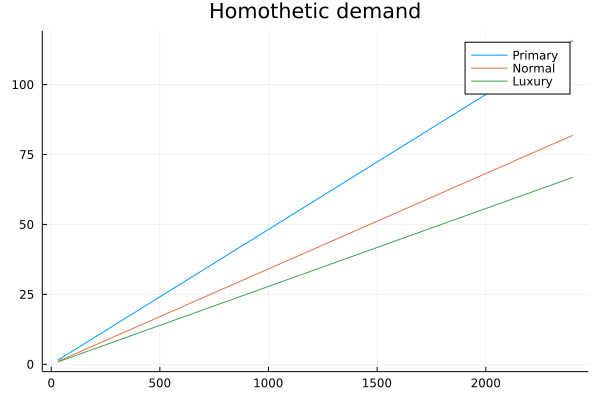

In [16]:
H_graph=H[:,[2,3,4,5]];
using Plots
Hgraph=sortslices(H_graph,dims=1,by=x->(x[1]),rev=false);
plot(Hgraph[:,1], Hgraph[:,[2,3,4]], title="Homothetic demand", label=["Primary" "Normal" "Luxury"])

In [9]:
using Plots, Distributions, StatsPlots
histogram(H[:,1]; bins = 0:0.8:20)

ErrorException: The function body AST defined by this @generated function is not pure. This likely means it contains a closure, a comprehension or a generator.

In [19]:
using DataFrames
function prices(p::Vector{Float64},T::Int64 ;cal=cal)
    #Prices normalized at date t=1
    pp=[p[1]]  #price primary
    pn=[p[2]]  #price normal
    pl=[p[3]]  #price luxury
    #AR(1)
    shock_size=1

    for t=1:T-1
        p_p=p[1]*cal.g[1]^(t)+shock_size*randn() # price dynamics of primary goods
        p_n=p[2]*cal.g[2]^(t)+shock_size*randn() # price dynamics of normal goods
        p_l=p[3]*cal.g[3]^(t)+shock_size*randn()

        pnp=p_p/p_n
        pnl=p_l/p_n

        #for matrix
        pp=push!(pp,p_p)
        pn=push!(pn,p_n)
        pl=push!(pl,p_l)
    end
    return [pp pn pl]
end
ptime=prices(p,T)

data=DataFrame(ptime,:auto)

rename!(data,[:"Primary P",:"Normal P", :"LuxuryP"])

,Primary P,Normal P,LuxuryP
,Float64,Float64,Float64
1,5.0,10.0,15.0
2,4.36607,10.3562,16.1902
3,5.06187,8.92413,14.1626
4,6.50371,10.3236,14.1989
5,7.00381,11.9422,15.134
6,7.25588,13.1716,14.8125
7,6.4877,12.2949,15.5316
8,6.2259,10.9177,15.1441
9,8.15855,11.6495,16.3144


In [20]:
#Function CES
function CES_UtilityOvertime(C::Vector{Float64}, p::Matrix{Float64}, T::Int64; cal=cal)
    #Budget, expenditure function
    Exp=[]
    Cons=[]
    Share=[]
    Utility=[]
    C_1=[]
    C_2=[]
    C_3=[]

    for t=1:T
        E=sum(p[t,i]*C[i] for i = 1:length(C))
        
        #CONS
        C1=(cal.γ[1]/p[t,1])^(cal.σ)*E/(sum(cal.γ[i]^cal.σ*p[t,i]^(1-cal.σ) for i=1:length(cal.γ)))
        C2=(cal.γ[2]/p[t,2])^(cal.σ)*E/(sum(cal.γ[i]^cal.σ*p[t,i]^(1-cal.σ) for i=1:length(cal.γ)))
        C3=(cal.γ[3]/p[t,3])^(cal.σ)*E/(sum(cal.γ[i]^cal.σ*p[t,i]^(1-cal.σ) for i=1:length(cal.γ)))

        CB=[C1 C2 C3]
        U=sum(cal.γ[i]*CB[i]^ρ for i=1:length(CB))^(1/ρ)


        #SHARE
        ω_p=(p[t,1]*C1)/E
        ω_n=(p[t,2]*C2)/E
        ω_l=(p[t,3]*C3)/E

        ω=[ω_p,ω_n,ω_l]

        Exp=push!(Exp,E)
        Cons=push!(Cons,CB)
        C_1=push!(C_1,C1)
        C_2=push!(C_2,C2)
        C_3=push!(C_3,C3)
        Utility=push!(Utility,U)
        Share=push!(Share, ω)

    end

    return [Utility Exp C_1 C_2 C_3 Share]
end

CES_UtilityOvertime (generic function with 1 method)

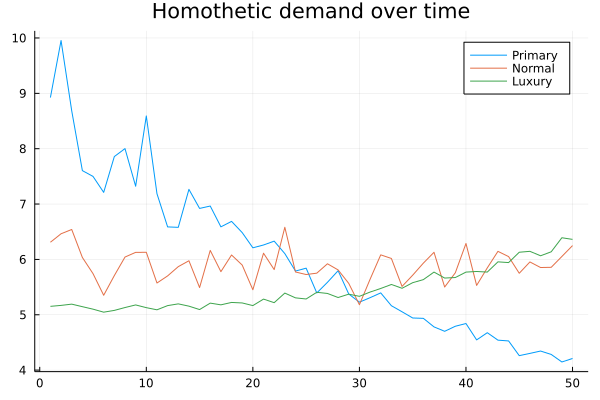

In [24]:
V=CES_UtilityOvertime(C, ptime, T)
(V[:,[2,3,4]])
C=Matrix{Float64}(V[:,[3,4,5]])
plot(1:T, C, title="Homothetic demand over time", label=["Primary" "Normal" "Luxury"])

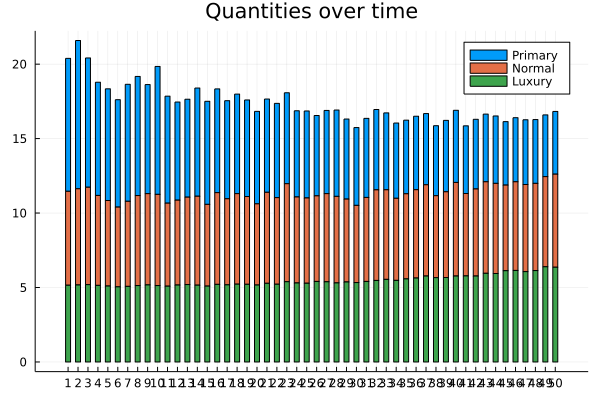

In [26]:
using StatsPlots
ticklabel =[1:T 1:T 1:T]
groupedbar(C,
        title="Quantities over time",
        bar_position = :stack,
        bar_width=0.5,
        xticks=(1:T, ticklabel),
        label=["Primary" "Normal" "Luxury"])

# Stone and Geary

In [7]:
#Function Stone and Geary
function SG(C::Vector{Int64}, cal)
    U=sum(cal.γ[i]*(C[i]+cal.κ[i])^ρ for i=1:length(C))^(1/ρ)
    return U
end

SG (generic function with 1 method)

# Non Homothetic Utility function

In [27]:
#Initial Price and endowment level
p=[5.0, 10.0, 15.0]
C=[5.0, 1.0, 10.0]
T=50

50

$$\mathcal{L}(U,C_1,...,C_I) = U+\Upsilon\left[1-\sum^I_i \gamma_i^{\frac{1}{\sigma}} \left[ \frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}\right] + \lambda \left[E-\sum^I_{i}p_iC_i \right]$$
FOCs of $\mathcal{L}$ wrt $U, (C_1, ...,C_I), \Upsilon, \lambda:$


$$\frac{\partial\mathcal{L}}{\partial U}=1-\Upsilon \frac{(1-\sigma)^2}{\sigma}\sum^{I}_{i=1}\gamma_i^{\frac{1}{\sigma}}\epsilon_i\frac{1}{U}\left[\frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0$$

\begin{equation}
  \begin{aligned}
    \forall i \in \mathcal{I}, \quad \frac{\partial\mathcal{L}}{\partial C_i}=
      & 
      \Upsilon \frac{1-\sigma}{\sigma} \left[\gamma_i^{\frac{1}{\sigma}}\frac{1}{C_i}\left(\frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right)^{\frac{\sigma-1}{\sigma}}\right]-\lambda p_i=0
  \end{aligned}
\end{equation}

Then

$$\forall i,j \in \mathcal{I}, \quad \frac{\gamma_i^{\frac{1}{\sigma}}\frac{1}{C_i}\left(\frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right)^{\frac{\sigma-1}{\sigma}}}{p_i}=\frac{ \gamma_j^{\frac{1}{\sigma}}\frac{1}{C_j}\left(\frac{C_j}{U^{(1-\sigma)\epsilon_j}}\right)^{\frac{\sigma-1}{\sigma}}}{p_j}$$

$$\frac{\partial\mathcal{L}}{\partial \lambda}=E-\sum^I_{i}p_iC_i=0$$
$$\frac{\partial\mathcal{L}}{\partial \Upsilon}=1-\sum^I_i \gamma_i^{\frac{1}{\sigma}} \left[ \frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0$$


This system of equation should then hold at the optimum F(.)= 0. 

\begin{equation}
    \begin{cases}
      \frac{\partial\mathcal{L}}{\partial U}=1-\Upsilon \frac{(1-\sigma)^2}{\sigma}\sum^{I}_{i=1}\gamma_i^{\frac{1}{\sigma}}\epsilon_i\frac{1}{U}\left[\frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0\\
      
      \forall i,j \in \mathcal{I}, \quad \frac{\gamma_i^{\frac{1}{\sigma}}\frac{1}{C_i}\left(\frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right)^{\frac{\sigma-1}{\sigma}}}{p_i}=\frac{ \gamma_j^{\frac{1}{\sigma}}\frac{1}{C_j}\left(\frac{C_j}{U^{(1-\sigma)\epsilon_j}}\right)^{\frac{\sigma-1}{\sigma}}}{p_j}\\
      
      \frac{\partial\mathcal{L}}{\partial \lambda}=E-\sum^I_{i}p_iC_i=0\\
      
      \frac{\partial\mathcal{L}}{\partial \Upsilon}=1-\sum^I_i \gamma_i^{\frac{1}{\sigma}} \left[ \frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0\\
    \end{cases}
\end{equation}

Optimal demands from resource constraints are equal to:

$$\forall i,j \in \mathcal{I}, \quad C_i=\left(\frac{p_i}{E}\right)^{-\sigma} \gamma_i U^{\epsilon_i(1-\sigma)^2}, \quad C_j=\left(\frac{p_j}{E}\right)^{-\sigma} \gamma_j U^{\epsilon_j(1-\sigma)^2}$$



By substituting this demand into $\frac{\partial\mathcal{L}}{\partial \Upsilon}=1-\sum^I_i \gamma_i^{\frac{1}{\sigma}} \left[ \frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0$


We end up with:

$$\frac{\partial\mathcal{L}}{\partial \Upsilon}=1-\sum^I_i \gamma_i^{\frac{1}{\sigma}} \left[ \frac{\left(\frac{p_i}{E}\right)^{-\sigma} \gamma_i}{ U^{(1-\sigma)\sigma \epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0$$
We know $\gamma_i, p_i, E, \sigma, \epsilon_i, \forall i \in \mathcal{I}$, then we can solve for U by having the optimal demand given endowment level. 

The system of equation will have the following form:


\begin{equation}
    \begin{cases}
      \frac{\partial\mathcal{L}}{\partial U}=1-\Upsilon \frac{(1-\sigma)^2}{\sigma}\sum^{I}_{i=1}\gamma_i^{\frac{1}{\sigma}}\epsilon_i\frac{1}{U}\left[\frac{C_i}{U^{(1-\sigma)\epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0\\
      
      \forall i,j \in \mathcal{I}, \quad C_i=\left(\frac{p_i}{E}\right)^{-\sigma} \gamma_i U^{\epsilon_i(1-\sigma)^2}, \quad C_j=\left(\frac{p_j}{E}\right)^{-\sigma} \gamma_j U^{\epsilon_j(1-\sigma)^2}\\
      
      \frac{\partial\mathcal{L}}{\partial \Upsilon}=1-\sum^I_i \gamma_i^{\frac{1}{\sigma}} \left[ \frac{\left(\frac{p_i}{E}\right)^{-\sigma} \gamma_i}{ U^{(1-\sigma)\sigma \epsilon_i}}\right]^{\frac{\sigma-1}{\sigma}}=0\\
      
      Solve \quad for \quad U 
    \end{cases}
\end{equation}

In [28]:
using NLsolve

#Which is exactly what our NLsolve does here
#find Umax with no waste
function solvingNH(u, C::Vector{Float64}, p::Vector{Float64}; cal=cal)
    E=sum(p[i]*C[i] for i=1:length(C))
    out=1-sum(cal.γ[i]^(1/cal.σ)*(((p[i]/E)^(-cal.σ)*cal.γ[i])/u^((1-cal.σ)*cal.σ*cal.ϵ[i]))^ρ for i=1:length(C))
    return out
end

function NHUtility(C::Vector{Float64}, p::Vector{Float64} ;cal=cal,tol=1e-10,T=100)
    res = nlsolve(u->[solvingNH(u[1], C, p)], [1.0])
    #Utility level for given C
    U=res.zero[1]

    #Wealth and Minimum expenditure for the utility at given endowment level
    E=sum(p[i]*C[i] for i=1:length(C))
    ExpNH=sum(cal.γ[i]*U^(cal.ϵ[i]*cal.σ*(1-cal.σ)) * (p[i]^(1-cal.σ)) for i = 1:length(C))^(1/(1-cal.σ))
    
    #Optimal Demand with income effect
    C1=cal.γ[1]*U^(cal.ϵ[1]*cal.σ*(1-cal.σ))  * (p[1]/E)^(-cal.σ)
    C2=cal.γ[2]*U^(cal.ϵ[2]*cal.σ*(1-cal.σ))  * (p[2]/E)^(-cal.σ)
    C3=cal.γ[3]*U^(cal.ϵ[3]*cal.σ*(1-cal.σ))  * (p[3]/E)^(-cal.σ)

    #Expenditure share with income effect
    ω_p=cal.γ[1]*U^(cal.ϵ[1]*cal.σ*(1-cal.σ))  * (p[1]/E)^(1-cal.σ)
    ω_n=cal.γ[2]*U^(cal.ϵ[2]*cal.σ*(1-cal.σ))  * (p[2]/E)^(1-cal.σ)
    ω_l=cal.γ[3]*U^(cal.ϵ[3]*cal.σ*(1-cal.σ))  * (p[3]/E)^(1-cal.σ)

    #Optimal update for demand
    C=[C1,C2,C3]
    ω=[ω_p, ω_n, ω_l]

    return [U, E, C1, C2, C3, ω]

end

NHUtility (generic function with 1 method)

In [29]:
NHU=NHUtility(C,p)

6-element Vector{Any}:
 103.34232368011817
 185.0
   4.065569041905814
   4.57124149285772
   7.930649324126105
    [0.10988024437583281, 0.24709413474906594, 0.6430256208750897]

In [31]:
println("NH pref optimal utility level with no waste ", NHU[1])
println("But we have to spend all the wealth so that there is no waste ", NHU[2])
println("With bundle (updated) ", [NHU[3],NHU[4],NHU[5]])
println("Optimal share with no waste ", NHU[6])

NH pref optimal utility level with no waste 103.34232368011817
But we have to spend all the wealth so that there is no waste 185.0
With bundle (updated) [4.065569041905814, 4.57124149285772, 7.930649324126105]
Optimal share with no waste [0.10988024437583281, 0.24709413474906594, 0.6430256208750897]


In [32]:
p=[5.0, 10.0, 15.0]

3-element Vector{Float64}:
  5.0
 10.0
 15.0

In [23]:
u=[]
Cendow=[]
Exp=[]
C1=[]
C2=[]
C3=[]

scale=80.0
for i = 1:scale
    for j=1:scale
        for k =1:scale
            res =NHUtility([i,j,k],p)
            u=push!(u,res[1])
            Exp=push!(Exp,res[2])
            Cendow=push!(Cendow,[i j k])
            C1=push!(C1,res[3])
            C2=push!(C2,res[4])
            C3=push!(C3,res[5])
        end
    end
end

NH=[u Exp C1 C2 C3];

In [25]:
NHgraph=NH[:,[2,3,4,5]]
NH_graph=sortslices(NHgraph,dims=1,by=x->(x[1]),rev=false)

512000×4 Matrix{Float64}:
   30.0   1.08239   0.923608    1.02347
   35.0   1.21261   1.06024     1.2223
   40.0   1.33769   1.19434     1.42454
   40.0   1.33769   1.19434     1.42454
   45.0   1.45841   1.32623     1.62971
   45.0   1.45841   1.32623     1.62971
   45.0   1.45841   1.32623     1.62971
   50.0   1.57538   1.45616     1.83743
   50.0   1.57538   1.45616     1.83743
   50.0   1.57538   1.45616     1.83743
    ⋮                         
 2380.0  24.888    39.9649    123.727
 2380.0  24.888    39.9649    123.727
 2385.0  24.9246   40.0351    124.002
 2385.0  24.9246   40.0351    124.002
 2385.0  24.9246   40.0351    124.002
 2390.0  24.9613   40.1053    124.276
 2390.0  24.9613   40.1053    124.276
 2395.0  24.9979   40.1755    124.55
 2400.0  25.0346   40.2456    124.825

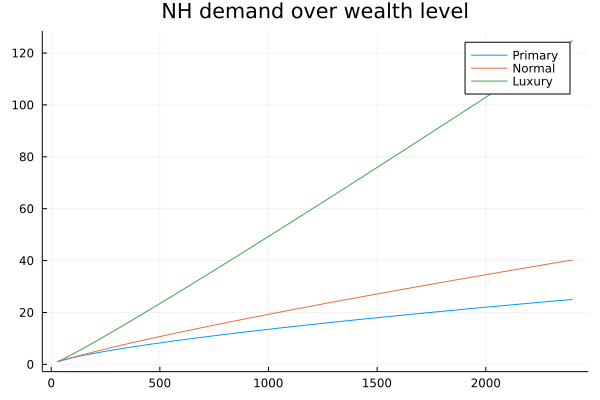

In [26]:
plot(NH_graph[:,1], NH_graph[:,[2,3,4]], title="NH demand over wealth level", label=["Primary" "Normal" "Luxury"])

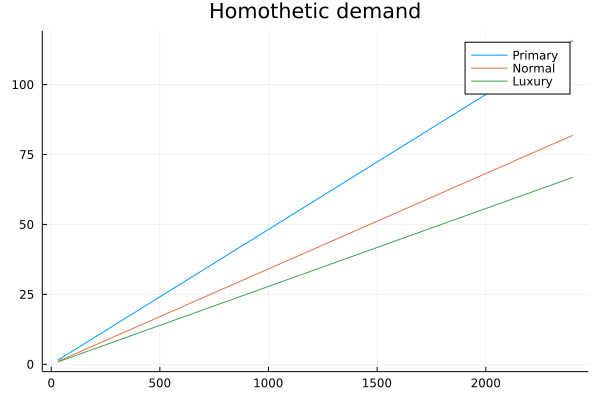

In [27]:
plot(Hgraph[:,1], Hgraph[:,[2,3,4]], title="Homothetic demand", label=["Primary" "Normal" "Luxury"])

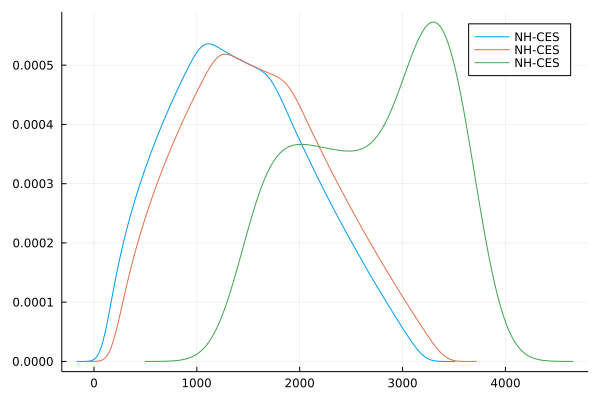

In [28]:
siz=scale^3
bin=floor(Int,siz/4)
density(NH[1:bin,1], label="NH-CES")
density(NH[bin:2*bin,1], label="NH-CES")
density!(NH[2*bin:3*bin,1], label="NH-CES")
density!(NH[end-100:end,1], label="NH-CES")


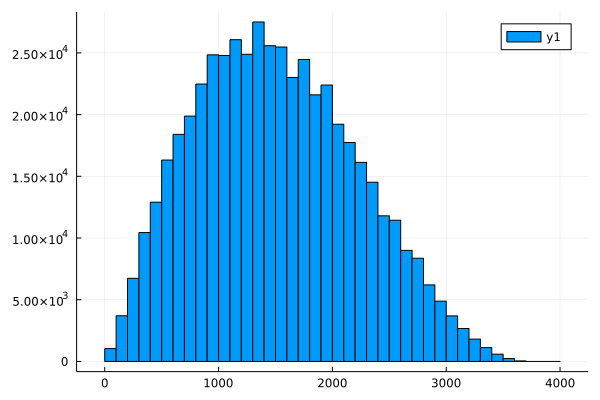

In [30]:
histogram(NH[:,1]; bins = 0:100.0:4000)

In [31]:
#Price dynamics
using Plots, DataFrames
function pricedynamics(p::Vector{Float64}, T::Int64; cal=cal, N=3)
#Time and number of household considered
    #Get our price level dynamics
    shock_size=2
    index=100.0 
    pp=[p[1]]  #price primary
    pn=[p[2]]  #price normal
    pl=[p[3]]  #price luxury
    agg=[1/N*(p[1]+p[2]+p[3])] #aggregate price with homothetic

    for t=1:T-1
        p_p=p[1]*cal.g[1]^(t)+shock_size*randn() # price dynamics of primary goods
        p_n=p[2]*cal.g[2]^(t)+shock_size*randn() # price dynamics of normal goods
        p_l=p[3]*cal.g[3]^(t)+shock_size*randn()
        agg_p=0.333*p_p+0.333*p_n+0.333*p_l #share coming from homothetic consumption bundle

        pp=push!(pp,p_p)
        pn=push!(pn,p_n)
        pl=push!(pl,p_l)
        agg=push!(agg,agg_p)
    end

    pricesplot = [pp pn pl agg]
    return plot(pricesplot, title="Prices dynamics", label=["Primary" "Normal" "Luxury" "Aggregate"], lw=2)
end
    

pricedynamics (generic function with 1 method)

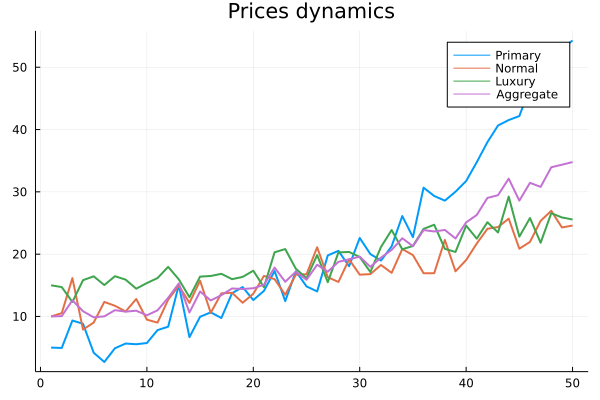

In [32]:
pricedynamics(p,T)

In [33]:
function prices(T::Int64 , p::Vector{Float64};cal=cal)
    #Prices normalized at date t=1
    pp=[p[1]]  #price primary
    pn=[p[2]]  #price normal
    pl=[p[3]]  #price luxury
    #Relative prices
    pnp_r=[1.0]
    pnl_r=[1.0]
    #AR(1)
    shock_size=1

    for t=1:T-1
        p_p=p[1]*cal.g[1]^(t)+shock_size*randn() # price dynamics of primary goods
        p_n=p[2]*cal.g[2]^(t)+shock_size*randn() # price dynamics of normal goods
        p_l=p[3]*cal.g[3]^(t)+shock_size*randn()

        pnp=p_p/p_n
        pnl=p_l/p_n

        #for matrix
        pp=push!(pp,p_p)
        pn=push!(pn,p_n)
        pl=push!(pl,p_l)

        pnp_r=push!(pnp_r,pnp)
        pnl_r=push!(pnl_r,pnl)
        
    end
    return [pp pn pl]
end
T=50
ptime=prices(T, p)

data=DataFrame(ptime,:auto)

rename!(data,[:"Primary P",:"Normal P", :"LuxuryP"])

,Primary P,Normal P,LuxuryP
,Float64,Float64,Float64
1,5.0,10.0,15.0
2,5.23213,10.2558,13.8578
3,5.9162,10.9863,14.0532
4,4.91251,10.5558,15.4143
5,5.84849,11.3716,16.699
6,5.7888,11.0543,15.3175
7,6.26806,11.0148,15.3967
8,6.83199,13.0605,17.3384
9,6.27591,12.3448,16.4407


In [34]:
function NHUtilitytime(C::Vector{Float64}, p::Matrix{Float64}, T::Int64;cal=cal,tol=1e-10)
    Exp=[]
    ExpNH=[]
    Cons=[]
    C1=[]
    C2=[]
    C3=[]
    Share=[]
    Utility=[]
    for t=1:T
        #Utility level for given C
        res = nlsolve(u->[solvingNH(u[1], C, p[t,:])], [1.0])
        U=res.zero[1]
        #Wealth level
        E=sum(p[t,i]*C[i] for i = 1:length(C))
                
        #Optimal demand with income effect
        c_p=cal.γ[1]*U^(cal.ϵ[1]*cal.σ*(1-cal.σ))  * (p[t,1]/E)^(-cal.σ)
        c_n=cal.γ[2]*U^(cal.ϵ[2]*cal.σ*(1-cal.σ))  * (p[t,2]/E)^(-cal.σ)
        c_l=cal.γ[3]*U^(cal.ϵ[3]*cal.σ*(1-cal.σ))  * (p[t,3]/E)^(-cal.σ)
        
        #Expenditure share with income effect
        ω_p=cal.γ[1]*U^(cal.ϵ[1]*cal.σ*(1-cal.σ))  * (p[t,1]/E)^(1-cal.σ)
        ω_n=cal.γ[2]*U^(cal.ϵ[2]*cal.σ*(1-cal.σ))  * (p[t,2]/E)^(1-cal.σ)
        ω_l=cal.γ[3]*U^(cal.ϵ[3]*cal.σ*(1-cal.σ))  * (p[t,3]/E)^(1-cal.σ)
        
        Consumption=[c_p, c_n, c_l]
        ω=[ω_p, ω_n, ω_l]
        Expnh=sum(p[t,i]*Consumption[i] for i = 1:length(C))
        ExpNH=push!(ExpNH,Expnh)
        Cons=push!(Cons, Consumption)
        C1=push!(C1, c_p)
        C2=push!(C2, c_n)
        C3=push!(C3, c_l)
        Share=push!(Share, ω)
        Utility=push!(Utility, U)
        Exp=push!(Exp,E)
    end

    return [Utility C1 C2 C3 Share Exp]
end

NHUtilitytime (generic function with 1 method)

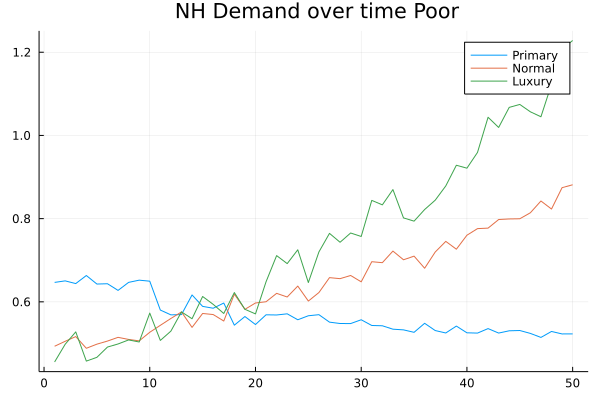

In [35]:
C=[1.0, 1.0, 0.0]
sim=NHUtilitytime(C, ptime, T)
G = Matrix{Float64}(sim[:,[2,3,4]])
plot(1:50, G, title=" NH Demand over time Poor",label=["Primary" "Normal" "Luxury"])

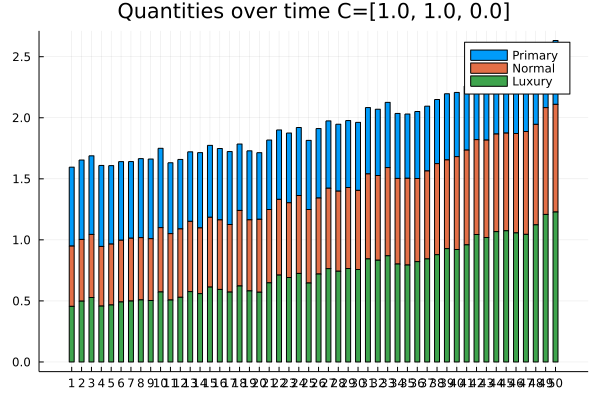

In [36]:
using StatsPlots
ticklabel =[1:T 1:T 1:T]
groupedbar(G,
        title="Quantities over time C=[1.0, 1.0, 0.0]",
        bar_position = :stack,
        bar_width=0.5,
        xticks=(1:T, ticklabel),
        label=["Primary" "Normal" "Luxury"])

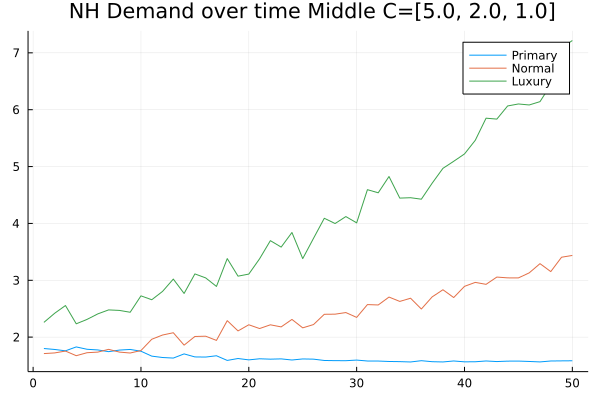

In [37]:
C=[5.0, 2.0, 1.0]
sim=NHUtilitytime(C, ptime, T)
G = Matrix{Float64}(sim[:,[2,3,4]])
plot(1:50, G, title=" NH Demand over time Middle C=[5.0, 2.0, 1.0]",label=["Primary" "Normal" "Luxury"])

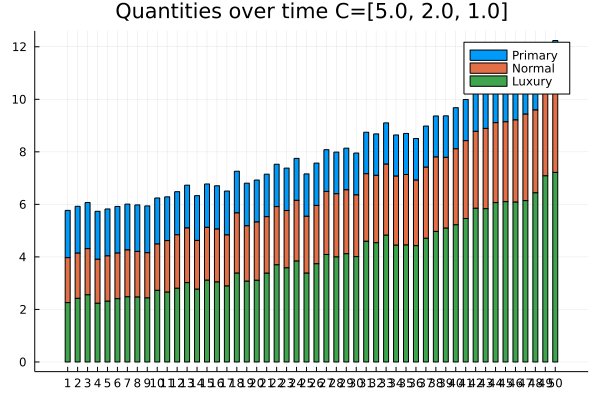

In [38]:
using StatsPlots
ticklabel =[1:T 1:T 1:T]
groupedbar(G,
        title="Quantities over time C=[5.0, 2.0, 1.0]",
        bar_position = :stack,
        bar_width=0.5,
        xticks=(1:T, ticklabel),
        label=["Primary" "Normal" "Luxury"])

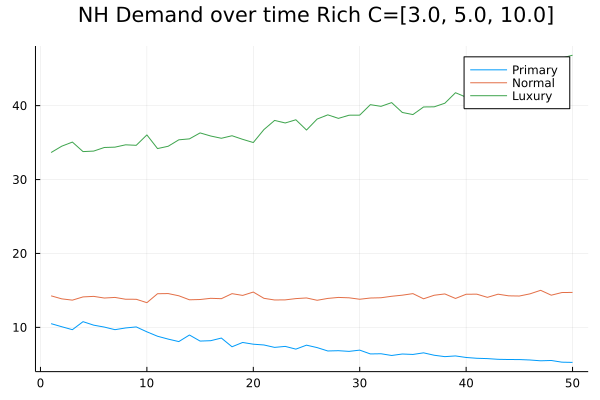

In [39]:
C=[10.0, 20.0, 30.0]
sim=NHUtilitytime(C, ptime, T)
G = Matrix{Float64}(sim[:,[2,3,4]])
plot(1:50, G, title=" NH Demand over time Rich C=[3.0, 5.0, 10.0]
",label=["Primary" "Normal" "Luxury"])

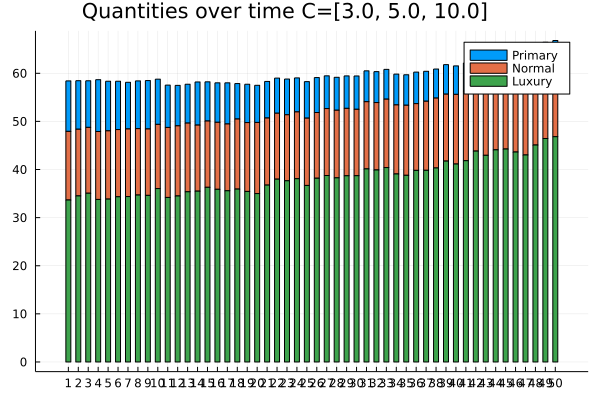

In [40]:
using StatsPlots
ticklabel =[1:T 1:T 1:T]
groupedbar(G,
        title="Quantities over time C=[3.0, 5.0, 10.0]        ",
        bar_position = :stack,
        bar_width=0.5,
        xticks=(1:T, ticklabel),
        label=["Primary" "Normal" "Luxury"])